## Importation des packages

In [1]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import *
from statsmodels.stats.diagnostic import acorr_ljungbox
import seaborn as sns
import scipy.stats as stats
from sklearn.cluster import KMeans
from sklearn import decomposition
from sklearn import preprocessing
import scipy.stats as st
from functions import *
from collections import Counter
from datetime import datetime as dt 
from statsmodels.tsa.api import ExponentialSmoothing
from scipy.stats import t, shapiro
from statsmodels.tsa.seasonal import seasonal_decompose
from scipy.stats import ks_2samp
import plotly.graph_objs as go
import plotly.express as px
from plotly.subplots import make_subplots 
from plotly.offline import init_notebook_mode, iplot
from sklearn.decomposition import PCA

## Importation des données

On télécharge un fichier de type csv contenant les offres disponibles pour travailler en tant que data analyst, data scientist et data engineer avec un ensemble d'informations sur le nom, l'emplacement et le secteur de la compagnie ... ect, qu'on a collecté via les sites linkedin et societe.

In [2]:
df1 = pd.read_csv("Data.csv")

In [3]:
df1.head(3)

,N° Siren,Nom de la compagnie,Secteur,Région,Période depuis la création (année),Nombre d'établissements,Nbre d'employés min,Nbre d'employés Max,Titre du poste,Emplacement du travail,Type de travail,Niveau requis,Nombre d'offres
0,751592510,AKTISEA,activités de centres d'appels,NICE,9,3,20.0,49.0,Data Analyst,"Bordeaux, Nouvelle-Aquitaine",CDI,Premier emploi,2
1,432610426,Avanade,Activité de la programmation informatique,ISSY-LES-MOULINEAUX,21,8,500.0,999.0,Data Engineer,"Lyon, Auvergne-Rhône-Alpes",CDI,Premier emploi,1
2,432610426,Avanade,Activité de la programmation informatique,ISSY-LES-MOULINEAUX,21,8,500.0,999.0,Data Engineer,"Lyon, Auvergne-Rhône-Alpes",Stage,Premier emploi,1


On télécharge le deuxième fichier contenant quelques résultats des entreprises concernées sur le site BFM Verif

In [4]:
df2 = pd.read_csv("fiche.csv")
df2.head(3)

,Nom de la compagnie,N° Siren,declaration,Chiffre d'affaires,Salaires et charges,Charges d'exploitation,Nombre d'employés,Publication des résultats
0,AKTISEA,751592510,2015.0,812742.0,709518.0,956273.0,49.0,compte rendu public
1,Avanade,432610426,2017.0,104096000.0,50951053.0,90081093.0,577.0,compte rendu public
2,Avanade,432610426,2018.0,120088000.0,57853134.0,100962358.0,657.0,compte rendu public


Dans un premier temps on utilise le package pandas profiling qui nous donne un rapport très utile pour analyser notre dataset

In [5]:
from pandas_profiling import ProfileReport
profile  =  ProfileReport ( df1 , title = "Rapport de la base de données" , explorative = True )
profile

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
profile2 =  ProfileReport ( df2 , title = "Rapport de la base de données" , explorative = True )
profile2

Summarize dataset:   0%|          | 0/22 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Nettoyage des données

Afin d'obtenir un dataset exploitable on fait le nettoyage des données qui est l'une des premières étapes lors de la réalisation d'un projet.  

A l'aide des rapports on peut voir que y’a pas de lignes doublons pour le premier dataset

In [7]:
df2.isnull().sum().sort_values()

Nom de la compagnie           0
N° Siren                      0
Publication des résultats     0
declaration                  22
Chiffre d'affaires           22
Charges d'exploitation       22
Salaires et charges          29
Nombre d'employés            81
dtype: int64

Nous sommes conscients qu'il y'a pas mal des valeurs manquantes du fait de sociètés étrangères ou des entreprises qui ne souhaitent pas rendre leurs comptes publics pendant certaines années ou n'ont jamais annoncé leurs résultats.\
Pour éviter d'avoir énormément de valeurs manquantes, le choix est de séparer les sociètés étrangère des entreprises qui ne mettent pas leurs comptes publics, et au finale nous traitons les données restantes. 


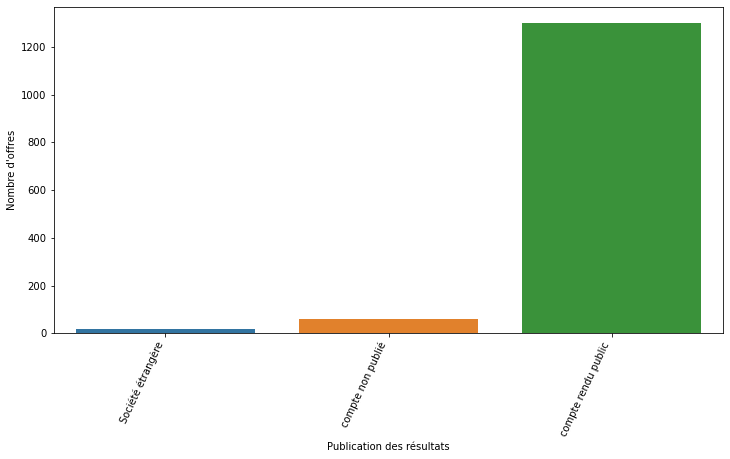

In [8]:
ddff=pd.merge(df1, df2 ,on=['N° Siren',"Nom de la compagnie"], how = 'inner')
ddff=ddff.groupby('Publication des résultats').sum().reset_index()
plt.figure(figsize = (12,6))
plot = sns.barplot(x = 'Publication des résultats', y = "Nombre d'offres", data = ddff)
plot = plot.set_xticklabels(plot.get_xticklabels(),
                           rotation = 65,
                           horizontalalignment = 'right')
plt.savefig("Publication des résultats.png",dpi=80, format='png', bbox_inches="tight")

In [9]:
socièté_étran=df2[(df2['Publication des résultats']=='Société étrangère')]
socièté_étran=socièté_étran[['Nom de la compagnie','N° Siren']]


In [10]:
socièté=df2[(df2['Publication des résultats']=='compte non publié')]
socièté=socièté[['Nom de la compagnie','N° Siren']]


In [11]:
entrp=df2[(df2['Publication des résultats']=='compte rendu public')]
entrp

,Nom de la compagnie,N° Siren,declaration,Chiffre d'affaires,Salaires et charges,Charges d'exploitation,Nombre d'employés,Publication des résultats
0,AKTISEA,751592510,2015.0,8.127420e+05,709518.0,9.562730e+05,49.0,compte rendu public
1,Avanade,432610426,2017.0,1.040960e+08,50951053.0,9.008109e+07,577.0,compte rendu public
2,Avanade,432610426,2018.0,1.200880e+08,57853134.0,1.009624e+08,657.0,compte rendu public
3,Avanade,432610426,2019.0,1.282880e+08,64088031.0,1.118475e+08,718.0,compte rendu public
4,Avanade,432610426,2020.0,1.280952e+08,64527933.0,1.126602e+08,802.0,compte rendu public
...,...,...,...,...,...,...,...,...
297,CodinGame,750538613,2019.0,2.216619e+06,1452980.0,1.939779e+06,22.0,compte rendu public
298,TotalEnergies,442395448,2015.0,1.828884e+09,24548011.0,1.856439e+09,303.0,compte rendu public
299,TotalEnergies,442395448,2016.0,2.749690e+09,27937000.0,2.606228e+09,325.0,compte rendu public
300,TotalEnergies,442395448,2017.0,3.820736e+09,28214000.0,3.872786e+09,333.0,compte rendu public


Ensuite nous créons des valeurs correspondant aux moyennes annuelles disponibles.

In [12]:
data=entrp.groupby(['N° Siren','Nom de la compagnie']).mean().reset_index()
data

,N° Siren,Nom de la compagnie,declaration,Chiffre d'affaires,Salaires et charges,Charges d'exploitation,Nombre d'employés
0,322306440,Dassault Systèmes,2018.5,1.625348e+09,4.958040e+08,1.311447e+09,3484.500000
1,326118502,Pierre Fabre Group,2018.5,8.828516e+08,7.690156e+07,9.659268e+08,798.000000
2,326300159,TF1,2018.5,1.149675e+09,1.871750e+08,1.229475e+09,NaN
3,330703844,Capgemini,2018.5,3.201258e+08,NaN,1.718848e+08,NaN
4,335146312,ABB,2018.5,5.364762e+08,1.056800e+08,5.650620e+08,1339.000000
...,...,...,...,...,...,...,...
75,822846366,Devoteam,2018.5,6.029967e+06,4.177546e+06,5.755228e+06,63.666667
76,824537856,Bending Spoons,2019.0,6.836130e+05,7.210125e+05,1.044128e+06,5.000000
77,840757587,Xiaomi Technology,2019.0,2.851393e+07,1.552247e+06,2.653318e+07,32.000000
78,844622738,Harry Hope,2019.0,9.214100e+04,1.375580e+05,2.142900e+05,NaN


On a 80 entreprises qui mettent leurs compte publics en tous on a 102 entreprises à la recherche des data scientists récemment

on vérifie les valeurs manquantes

In [13]:
data.isnull().sum().sort_values()

N° Siren                  0
Nom de la compagnie       0
declaration               0
Chiffre d'affaires        0
Charges d'exploitation    0
Salaires et charges       1
Nombre d'employés         5
dtype: int64

comme on a le nbre d'employés minimum et maximum on a décidé de supprimer la variable nombre d'employés

In [14]:
data.drop(["Nombre d'employés"], axis=1, inplace=True)

on détermine les entreprises concerné par les valeurs manquantes

In [15]:
data[data["Salaires et charges"].isnull()==True]

,N° Siren,Nom de la compagnie,declaration,Chiffre d'affaires,Salaires et charges,Charges d'exploitation
3,330703844,Capgemini,2018.5,320125750.0,NaN,171884750.0


comme on n'a pas trouvé salaire et charge de l'entreprise capgemini on la supprime 

In [16]:
data.drop(data.loc[data['Nom de la compagnie']=='Capgemini'].index, inplace=True)


In [17]:
data

,N° Siren,Nom de la compagnie,declaration,Chiffre d'affaires,Salaires et charges,Charges d'exploitation
0,322306440,Dassault Systèmes,2018.5,1.625348e+09,4.958040e+08,1.311447e+09
1,326118502,Pierre Fabre Group,2018.5,8.828516e+08,7.690156e+07,9.659268e+08
2,326300159,TF1,2018.5,1.149675e+09,1.871750e+08,1.229475e+09
4,335146312,ABB,2018.5,5.364762e+08,1.056800e+08,5.650620e+08
5,335186094,Ubisoft,2019.5,1.262532e+09,1.990500e+06,2.128822e+09
...,...,...,...,...,...,...
75,822846366,Devoteam,2018.5,6.029967e+06,4.177546e+06,5.755228e+06
76,824537856,Bending Spoons,2019.0,6.836130e+05,7.210125e+05,1.044128e+06
77,840757587,Xiaomi Technology,2019.0,2.851393e+07,1.552247e+06,2.653318e+07
78,844622738,Harry Hope,2019.0,9.214100e+04,1.375580e+05,2.142900e+05


## Analyses exploratoires des données

Une fois le nettoyage des données effectuées, on va pouvoir passer à l'étape des analyses exploratoires des données. Grâce à cette étape, on va pouvoir se familiariser avec nos données, découvrir les caractéristiques des entreprises qui recrutent les data scientists.

In [18]:
# Affichage du nombre d'entreprises et de leurs noms
entreprise = df1['Nom de la compagnie'].unique()
print('Nombre total des entreprises :', len(entreprise))
print(sorted(entreprise))

Nombre total des entreprises : 102
['ABB', 'ACTIVUS Group', 'ADEO', 'AKTISEA', 'AKUR8', 'APSIDE TOP', 'AXA en France', 'Accenture France', 'Ad Scientiam', 'Adsearch', 'All You Need', 'Atos', 'Aubay', 'Avanade', 'BI consulting', 'BMW Group France', 'BNP Paribas', 'BRED', 'Beelix', 'Believe', 'Bending Spoons', 'Betclic Group', 'Birdz', 'Blue Search Conseil', 'Botify', 'Business & Decision', 'CHANEL', 'CHAUMET', 'CMA CGM', 'Capgemini', 'Carrefour', 'Cdiscount', 'Citymapper', 'Club Med', 'CodinGame', 'Contentsquare', "Crédit Agricole d'Ile-de-France", 'Crédit Mutuel Loire Atlantique Centre Ouest', 'DPDgroup', 'Dassault Systèmes', 'Datadog', 'Davidson consulting', 'Decathlon France', 'Deloitte', 'Devoteam', 'ENGIE', 'Eaton', 'Groupe Casino', 'Groupe SEB', 'Harry Hope', 'IKIGAÏ', 'IVIDATA LIFE SCIENCES', 'Inetum', 'Inside Group', 'Ipsos France', 'JACEM', 'JACQUEMUS', 'Jellyfish', 'Jellysmack', 'JobTeaser', 'Kereon Intelligence', 'LINCOLN', 'La Banque Postale', 'Licorne Society', 'Lévavi', 'M

In [19]:
# Affichage du nombre d'entreprises étrangères et de leurs noms
entreprise = socièté_étran['Nom de la compagnie'].unique()
print('Nombre total des entreprises étrangères:', len(entreprise))
print(sorted(entreprise))

Nombre total des entreprises étrangères: 2
['Jellysmack', 'The NPD Group']


In [20]:
df_socièté_étran=pd.merge(df1, socièté_étran, on='N° Siren', how = 'inner')
df_socièté_étran

,N° Siren,Nom de la compagnie_x,Secteur,Région,Période depuis la création (année),Nombre d'établissements,Nbre d'employés min,Nbre d'employés Max,Titre du poste,Emplacement du travail,Type de travail,Niveau requis,Nombre d'offres,Nom de la compagnie_y
0,392720843,The NPD Group,Activité des études de marché et sondages,ETATS-UNIS,28,6,100.0,199.0,Data Scientist,"Paris, Île-de-France",Stage,Premier emploi,1,The NPD Group
1,843359423,Jellysmack,Activité de la production de films et de progr...,LEVALLOIS-PERRET,3,2,1.0,2.0,Data Engineer,À distance,CDI,Manager,1,Jellysmack
2,843359423,Jellysmack,Activité de la production de films et de progr...,LEVALLOIS-PERRET,3,2,1.0,2.0,Data Engineer,À distance,CDI,Premier emploi,1,Jellysmack
3,843359423,Jellysmack,Activité de la production de films et de progr...,LEVALLOIS-PERRET,3,2,1.0,2.0,Data Engineer,"Paris, Île-de-France",CDI,Premier emploi,1,Jellysmack
4,843359423,Jellysmack,Activité de la production de films et de progr...,LEVALLOIS-PERRET,3,2,1.0,2.0,Data Analyst,À distance,CDI,Manager,3,Jellysmack
5,843359423,Jellysmack,Activité de la production de films et de progr...,LEVALLOIS-PERRET,3,2,1.0,2.0,Data Analyst,"Paris, Île-de-France",CDI,Manager,4,Jellysmack
6,843359423,Jellysmack,Activité de la production de films et de progr...,LEVALLOIS-PERRET,3,2,1.0,2.0,Data Analyst,"Paris, Île-de-France",CDI,Confirmé,1,Jellysmack
7,843359423,Jellysmack,Activité de la production de films et de progr...,LEVALLOIS-PERRET,3,2,1.0,2.0,Data Scientist,"Paris, Île-de-France",CDI,Manager,2,Jellysmack
8,843359423,Jellysmack,Activité de la production de films et de progr...,LEVALLOIS-PERRET,3,2,1.0,2.0,Data Scientist,"Paris, Île-de-France",CDI,Premier emploi,4,Jellysmack


In [21]:
# Affichage du nombre d'entreprises qui ne souhaitent pas rendre leurs comptes publics. et de leurs noms
entreprise = socièté['Nom de la compagnie'].unique()
print('Nombre total des entreprises qui ne souhaitent pas rendre leurs comptes publics.:', len(entreprise))
print(sorted(entreprise))

Nombre total des entreprises qui ne souhaitent pas rendre leurs comptes publics.: 20
['AKUR8', 'AXA en France', 'Accenture France', 'All You Need', 'BNP Paribas', 'BRED', 'Beelix', 'Betclic Group', 'Citymapper', 'Crédit Mutuel Loire Atlantique Centre Ouest', 'IKIGAÏ', 'Jellyfish', 'JobTeaser', 'Kereon Intelligence', 'La Banque Postale', 'Licorne Society', 'Lévavi', 'Praexo', 'Universal Music Group', 'Wizaly']


In [22]:
df_socièté=pd.merge(df1, socièté ,on=['N° Siren',"Nom de la compagnie"], how = 'inner')
df_socièté

,N° Siren,Nom de la compagnie,Secteur,Région,Période depuis la création (année),Nombre d'établissements,Nbre d'employés min,Nbre d'employés Max,Titre du poste,Emplacement du travail,Type de travail,Niveau requis,Nombre d'offres
0,819670654,Lévavi,Activité du conseil pour les affaires et autre...,BEAUMONT-MONTEUX,5,2,1.0,2.0,Data Analyst,"Lille, Hauts-de-France",CDI,Premier emploi,1
1,807604608,Wizaly,Activité du conseil en systèmes et logiciels i...,PARIS,7,2,10.0,19.0,Data Analyst,"Paris, Île-de-France",Stage,Premier emploi,1
2,807604608,Wizaly,Activité du conseil en systèmes et logiciels i...,PARIS,7,2,10.0,19.0,Data Analyst,"Paris, Île-de-France",CDI,Premier emploi,1
3,812649796,Betclic Group,Activité du conseil pour les affaires et autre...,BORDEAUX,6,3,10.0,19.0,Data Analyst,"Bordeaux, Nouvelle-Aquitaine",CDI,Confirmé,1
4,812649796,Betclic Group,Activité du conseil pour les affaires et autre...,BORDEAUX,6,3,10.0,19.0,Data Engineer,"Bordeaux, Nouvelle-Aquitaine",CDI,Premier emploi,1
5,849741905,Kereon Intelligence,Activité du conseil pour les affaires et autre...,NIORT,2,1,NaN,NaN,Data Analyst,"Paris, Île-de-France",CDI,Confirmé,1
6,849741905,Kereon Intelligence,Activité du conseil pour les affaires et autre...,NIORT,2,1,NaN,NaN,Data Analyst,"Paris, Île-de-France",CDI,Premier emploi,1
7,800931925,Jellyfish,Activités des agences de publicité,PARIS,6,4,50.0,99.0,Data Analyst,"Paris, Île-de-France",CDI,Manager,1
8,802504662,All You Need,Activité de l'autre mise à disposition de ress...,LILLE,7,3,3.0,5.0,Data Analyst,"Calais, Hauts-de-France",CDI,Confirmé,1
9,802504662,All You Need,Activité de l'autre mise à disposition de ress...,LILLE,7,3,3.0,5.0,Data Analyst,"Calais, Hauts-de-France",CDI,Premier emploi,1


In [23]:
df_socièté['Secteur'].unique()

array(['Activité du conseil pour les affaires et autres conseils de gestion',
       'Activité du conseil en systèmes et logiciels informatiques',
       'Activités des agences de publicité',
       "Activité de l'autre mise à disposition de ressources humaines",
       'Activité des portails internet. Societe',
       'Activité des banques mutualistes',
       'Activité des autres activités des services financiers, hors assurance et caisses de retraite',
       'Activités des sociétés holding',
       'Activité de la programmation informatique',
       'Activité des autres intermédiations monétaires',
       'Activité des fonds de placement et entités financières similaires'],
      dtype=object)

In [24]:
df1['Titre du poste'].unique()

array(['Data Analyst ', 'Data Engineer ', 'Data Scientist '], dtype=object)

## Analyses descriptives

### Analyses univariées

 A partir le premier rapport on peut conclure que:\
 Il existe différents secteurs qui emploient les data-worker, en particulier le secteur d'activité du conseil en systèmes et logiciels informatiques.\
La majorité des entreprises ont leur siège à paris.\
La plupart des offres d'emploi sont disponibles à paris.



Pour vérifer la normalité des variables on crée une fonction qui trace la distribution d'une variable et donne le résultat à l'adéquation à la loi normale où on utilise le test de Kolmogorov-Smirnov

In [25]:
def distrib_normalize(data, i):

    print(i.capitalize())
    sns.displot(data[i], kde=True,bins=10)
    plt.axvline(x=data[i].mean(), label='Moyenne', linestyle='-', color='r', linewidth=2)
    plt.axvline(x=data[i].median(), label='Médiane', linestyle='--', color='b', linewidth=2)
    plt.show()
    print(str(ks_2samp(data[i],list(np.random.normal(np.mean(data[i]), np.std(data[i]), 1000)))))
    print()

In [26]:
cols1 = ['Période depuis la création (année)',"Nombre d'établissements","Nombre d'offres","Nbre d'employés min","Nbre d'employés Max"]
cols2 = ["Chiffre d'affaires",'Salaires et charges',"Charges d'exploitation"]


Période depuis la création (année)


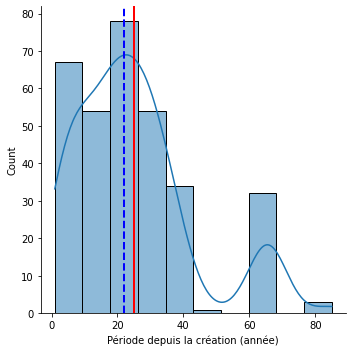

KstestResult(statistic=0.16689783281733747, pvalue=2.045044830478737e-06)

Nombre d'établissements


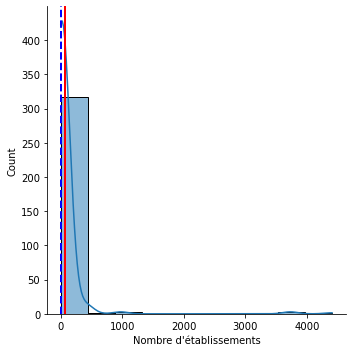

KstestResult(statistic=0.442, pvalue=5.551115123125783e-16)

Nombre d'offres


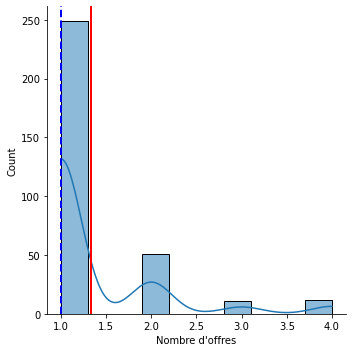

KstestResult(statistic=0.44389783281733747, pvalue=5.551115123125783e-16)

Nbre d'employés min


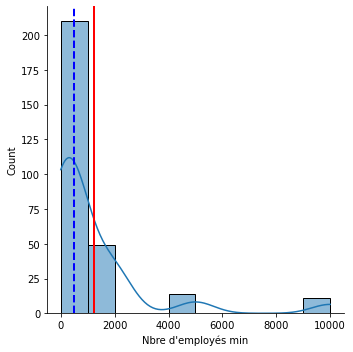

KstestResult(statistic=0.271, pvalue=5.551115123125783e-16)

Nbre d'employés max


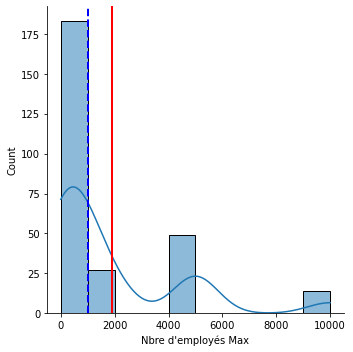

KstestResult(statistic=0.2358452012383901, pvalue=2.048583525038339e-12)



In [27]:
for elt in cols1:
    distrib_normalize(df1, elt)

Chiffre d'affaires


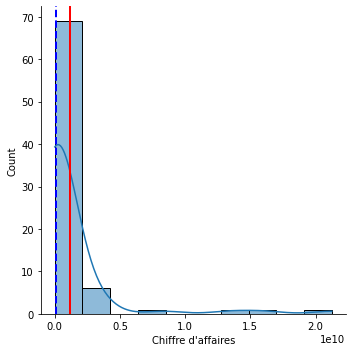

KstestResult(statistic=0.381, pvalue=4.761375738127072e-10)

Salaires et charges


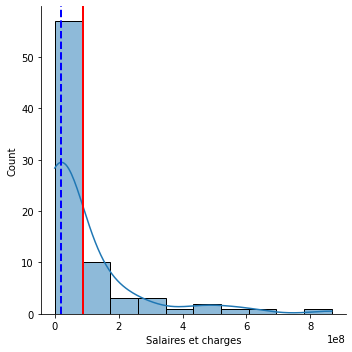

KstestResult(statistic=0.2708607594936709, pvalue=3.109918601207351e-05)

Charges d'exploitation


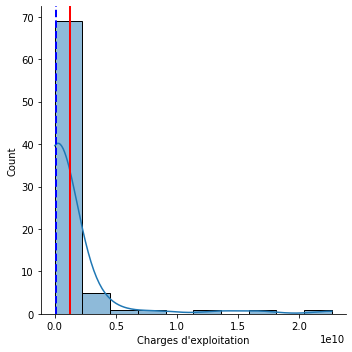

KstestResult(statistic=0.362, pvalue=4.3239489766477845e-09)



In [28]:
for elt in cols2:
    distrib_normalize(data, elt)

le test de Kolmogorov-Smirnov nous indique qu'aucune de nos variables ne suit la loi normale, et comme la taille de notre base de donnes dépasse le 30 on accepte la normalité.

In [29]:
df1["Nombre d'offres"].sum()

432

Il existe plus de 432 offres disponibles sur le site de linkedin récemment

On regroupe les données par le titre du poste pour calculer le nombre d'offres disponibles pour chaque type d'emploi

In [30]:
s=df1.groupby('Titre du poste').sum().reset_index()
s=s[['Titre du poste',"Nombre d'offres"]]
s

,Titre du poste,Nombre d'offres
0,Data Analyst,161
1,Data Engineer,125
2,Data Scientist,146


Data analysts les plus recherchés par rapport data scientists et data engineers

On calcul le value counts du nombre d'entreprises par titre de poste

In [31]:
y=df1.groupby(['Titre du poste','Nom de la compagnie']).count().reset_index()
y=y[['Titre du poste','Nom de la compagnie']]
y.rename(columns = {'Nom de la compagnie':"Nbre d'entreprise"}, inplace = True)
y=y.drop_duplicates(subset=None, 
                          keep='first', 
                          inplace=False, 
                          ignore_index=False)
y1=y.groupby(['Titre du poste']).count().reset_index()

y1


,Titre du poste,Nbre d'entreprise
0,Data Analyst,72
1,Data Engineer,39
2,Data Scientist,52


Ça permet de calculer le ratio entre le nombre d'offre par entreprise pour chaque titre de poste.

In [32]:
en=pd.merge(s, y1, on=['Titre du poste'], how = 'inner')
en['Ratio_offre_entreprise']=en["Nombre d'offres"]/en["Nbre d'entreprise"]
en
# si une seule entreprise demande plein de data analyst c'est très différent que si plein d'entreprises demandent les data analyst

,Titre du poste,Nombre d'offres,Nbre d'entreprise,Ratio_offre_entreprise
0,Data Analyst,161,72,2.236111
1,Data Engineer,125,39,3.205128
2,Data Scientist,146,52,2.807692


In [33]:
m=df1.groupby(['Titre du poste','Type de travail']).sum().reset_index()
m=m[['Titre du poste','Type de travail',"Nombre d'offres"]]
m.rename(columns = {"Nombre d'offres":"Nombre d'offres/type de tra"}, inplace = True)
m

,Titre du poste,Type de travail,Nombre d'offres/type de tra
0,Data Analyst,CDD,6
1,Data Analyst,CDI,121
2,Data Analyst,Stage,34
3,Data Engineer,CDD,1
4,Data Engineer,CDI,110
5,Data Engineer,Stage,14
6,Data Scientist,CDD,2
7,Data Scientist,CDI,93
8,Data Scientist,Stage,51


On s'aperçoit que les Data engineers n'ont pas beaucoup de chance de faire un stage 

In [34]:
KKKK=pd.merge(en, m, on=['Titre du poste'], how = 'inner')
KKKK

,Titre du poste,Nombre d'offres,Nbre d'entreprise,Ratio_offre_entreprise,Type de travail,Nombre d'offres/type de tra
0,Data Analyst,161,72,2.236111,CDD,6
1,Data Analyst,161,72,2.236111,CDI,121
2,Data Analyst,161,72,2.236111,Stage,34
3,Data Engineer,125,39,3.205128,CDD,1
4,Data Engineer,125,39,3.205128,CDI,110
5,Data Engineer,125,39,3.205128,Stage,14
6,Data Scientist,146,52,2.807692,CDD,2
7,Data Scientist,146,52,2.807692,CDI,93
8,Data Scientist,146,52,2.807692,Stage,51


In [35]:
d=df1.groupby(['Secteur','Type de travail','Emplacement du travail']).sum().reset_index()
d=d[['Secteur','Type de travail','Emplacement du travail',"Nombre d'offres"]]
d.sort_values("Nombre d'offres", ascending=False).head(10)

,Secteur,Type de travail,Emplacement du travail,Nombre d'offres
147,Activité du conseil pour les affaires et autre...,CDI,"Paris, Île-de-France",22
129,Activité du conseil en systèmes et logiciels i...,CDI,"Paris, Île-de-France",21
121,Activité du conseil en systèmes et logiciels i...,CDI,"Levallois-Perret, Île-de-France",16
42,Activité de la production de films et de progr...,CDI,"Paris, Île-de-France",12
48,Activité de la programmation informatique,CDI,"Paris, Île-de-France",9
9,Activité de l'edition de logiciels applicatifs,CDI,"Paris, Île-de-France",9
71,Activité des autres intermédiations monétaires,CDI,"Paris, Île-de-France",8
122,Activité du conseil en systèmes et logiciels i...,CDI,"Lille, Hauts-de-France",7
16,Activité de l'entretien et réparation d'autres...,CDI,"Lyon, Auvergne-Rhône-Alpes",6
150,Activité du conseil pour les affaires et autre...,Stage,"Paris, Île-de-France",6


Les entreprises du secteur d'activité du conseil en systèmes et logiciels informatiques qui embauchent le plus en CDI ou stage

In [36]:
df3=pd.merge(df1, data, on=['N° Siren','Nom de la compagnie'], how = 'inner')

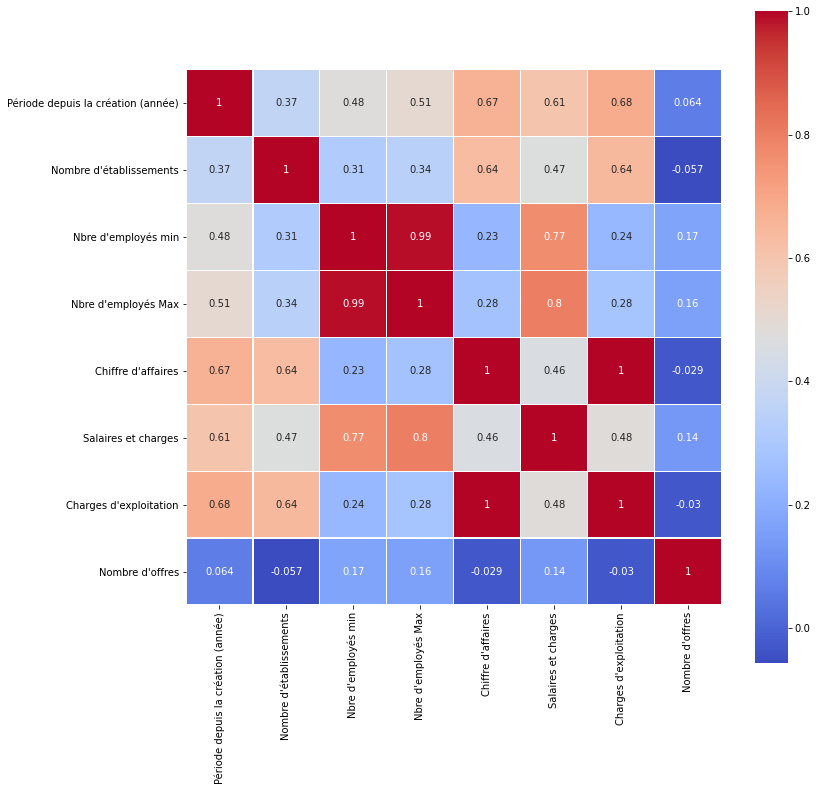

In [37]:
ll=df3.groupby(['N° Siren','Nom de la compagnie','Secteur','Région',"Période depuis la création (année)","Nombre d'établissements","Nbre d'employés min","Nbre d'employés Max",'Titre du poste',"Chiffre d'affaires","Salaires et charges","Charges d'exploitation"]).sum().reset_index()
ll=ll[['N° Siren','Nom de la compagnie','Secteur','Région',"Période depuis la création (année)","Nombre d'établissements","Nbre d'employés min","Nbre d'employés Max",'Titre du poste',"Chiffre d'affaires","Salaires et charges","Charges d'exploitation","Nombre d'offres"]]
corrMatrix = ll.corr()
plt.figure(figsize=(12,12))
sns.heatmap(corrMatrix, square=True, annot=True, linewidths=.5, cmap='coolwarm')
plt.show()

A l'aide de cette matrice, on peut supprimer les variables qui ont une forte corrélation avec les autres pour éviter la redondance dans nos variables,  Cela concerne les charges d'exploitation.

In [38]:
ll=df3.groupby(['N° Siren','Nom de la compagnie','Région','Secteur',"Période depuis la création (année)","Nombre d'établissements","Nbre d'employés min",'Titre du poste',"Chiffre d'affaires","Salaires et charges","Charges d'exploitation"]).sum().reset_index()


In [39]:
# On enlève la variable "charges d'exploitation" qui a une forte corrélation avec la variable "chiffre d'affaires"
ll.drop(["Charges d'exploitation"], axis=1, inplace=True)

In [40]:
ll.drop(["Nbre d'employés Max"], axis=1, inplace=True)

On remarque que le nombre d'offre n'a aucun lien avec les autres variables donc on va étudier la corrélation du nombre d'offre de chaque titre de poste  avec les autres variables alors on va calculer la somme de nombre d'offre des entreprises de chaque poste 

ensuite, on va effectuer une rotation de notre dataset en lui indiquant que l'on souhaite que le contenu de notre colonne "Titre du poste" devienne l'intitulé des colonnes. Pour cela, on va utiliser la commande "pivot_table"

In [41]:
# Modification de notre dataset pour obtenir des colonnes correspondant à nos variables d'intérêt
dff = pd.pivot_table(ll, index=['Nom de la compagnie'], columns= "Titre du poste", values="Nombre d'offres", aggfunc=np.mean).reset_index()


In [42]:
dff

Titre du poste,Nom de la compagnie,Data Analyst,Data Engineer,Data Scientist
0,ABB,1.0,NaN,NaN
1,ACTIVUS Group,4.0,NaN,1.0
2,ADEO,2.0,1.0,NaN
3,AKTISEA,2.0,NaN,NaN
4,APSIDE TOP,1.0,NaN,NaN
...,...,...,...,...
74,Volvo Group,3.0,2.0,1.0
75,Xelya,1.0,NaN,NaN
76,Xiaomi Technology,1.0,NaN,NaN
77,Zenly,1.0,NaN,NaN


Remplacer les valeurs manquantes par 0

In [43]:
dff=dff.fillna(0)

 On laisse les variables qui nous intérèsse

In [44]:
df4=df3[["N° Siren","Nom de la compagnie",'Période depuis la création (année)',"Nombre d'établissements","Chiffre d'affaires","Salaires et charges","Nbre d'employés min"]]

In [45]:
df5=pd.merge(df4, dff ,on='Nom de la compagnie', how = 'inner')
df5

,N° Siren,Nom de la compagnie,Période depuis la création (année),Nombre d'établissements,Chiffre d'affaires,Salaires et charges,Nbre d'employés min,Data Analyst,Data Engineer,Data Scientist
0,751592510,AKTISEA,9,3,8.127420e+05,709518.00,20.0,2.0,0.0,0.0
1,432610426,Avanade,21,8,1.201418e+08,59355037.75,500.0,0.0,11.0,1.0
2,432610426,Avanade,21,8,1.201418e+08,59355037.75,500.0,0.0,11.0,1.0
3,432610426,Avanade,21,8,1.201418e+08,59355037.75,500.0,0.0,11.0,1.0
4,432610426,Avanade,21,8,1.201418e+08,59355037.75,500.0,0.0,11.0,1.0
...,...,...,...,...,...,...,...,...,...,...
247,442395448,TotalEnergies,19,8,3.294925e+09,28391002.75,500.0,7.0,1.0,6.0
248,442395448,TotalEnergies,19,8,3.294925e+09,28391002.75,500.0,7.0,1.0,6.0
249,442395448,TotalEnergies,19,8,3.294925e+09,28391002.75,500.0,7.0,1.0,6.0
250,442395448,TotalEnergies,19,8,3.294925e+09,28391002.75,500.0,7.0,1.0,6.0


On supprime les lignes répétées

In [46]:
df5=df5.drop_duplicates(subset=None, 
                          keep='first', 
                          inplace=False, 
                          ignore_index=False)

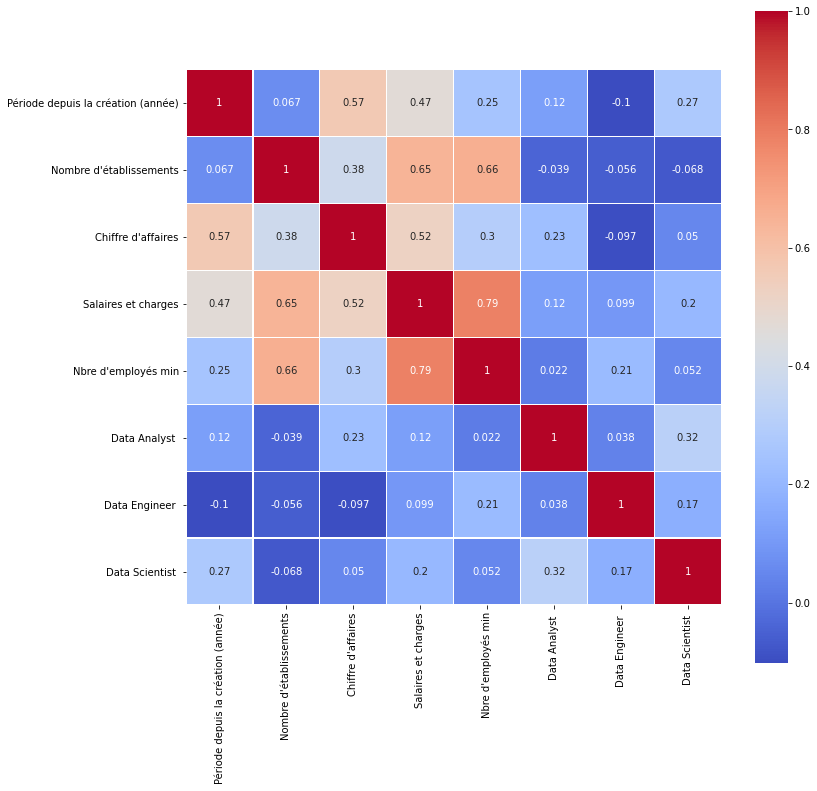

In [47]:
corrMatrix = df5.corr()
plt.figure(figsize=(12,12))
sns.heatmap(corrMatrix, square=True, annot=True, linewidths=.5, cmap='coolwarm')
plt.show()

et comme on veut voir la relation entre le type de profil et les caractéristiques des entreprises on trace un graphique par paire selon le type de profil (notre objectif)

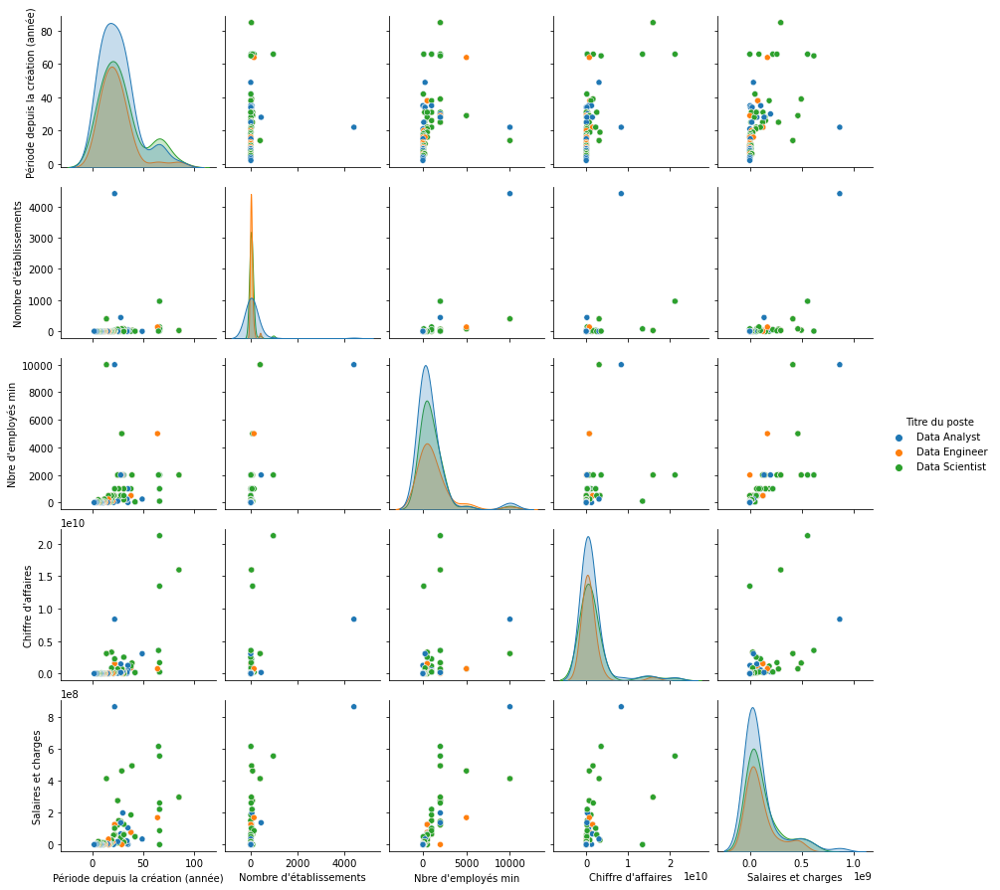

In [48]:
ll2=ll[['N° Siren','Nom de la compagnie','Région','Secteur',"Période depuis la création (année)","Nombre d'établissements","Nbre d'employés min",'Titre du poste',"Chiffre d'affaires","Salaires et charges"]]
sns.pairplot(ll2,hue="Titre du poste")
plt.savefig("graphiques par paire selon le type de profil.png",dpi=80, format='png', bbox_inches="tight")

On constate qu'il y'a pas beaucoup différence entre les entreprises qui embauchent les trois types de profils sauf que les grandes entreprises recherchent souvent les data engineers et que les moyennes embauchent des data scientists.

## Clustering via la méthode du K-Means

### Détermination du nombre de clusters

<ipython-input-49-9d55f5123871>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\BOULANGER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.



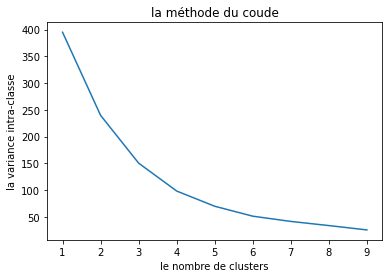

In [49]:
# Calcule l'enertie interaclasse (pour voir si on rajoute une classe ça baisse significativement ou pas) )
ll.index=ll['Nom de la compagnie']
Data=ll[['Période depuis la création (année)',"Nombre d'établissements","Chiffre d'affaires","Salaires et charges","Nbre d'employés min"]]
Data.drop_duplicates(keep = 'first', inplace=True)
X = Data.values
# Centrage et Réduction
std_scale = preprocessing.StandardScaler().fit(X)
X_scaled = std_scale.transform(X)
inertia=[]
k_range=range(1,10)
for k in k_range:
    model=KMeans(n_clusters=k).fit(X_scaled)
    inertia.append(model.inertia_)
plt.plot(k_range,inertia)  
plt.xlabel('le nombre de clusters')
plt.ylabel('la variance intra-classe')
plt.title('la méthode du coude')

plt.savefig("la méthode du coude.png",dpi=80, format='png', bbox_inches="tight")

C:\Users\BOULANGER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.



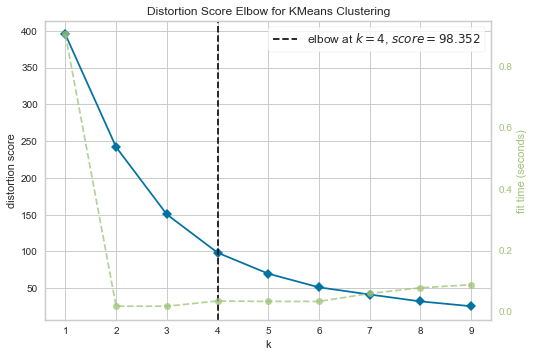

<Figure size 576x396 with 0 Axes>

In [53]:
from yellowbrick.cluster import KElbowVisualizer
coude=KElbowVisualizer(km,k=(1,10),metric='distortion',timing=True)
coude.fit(X_scaled)
coude.show()
plt.tight_layout()
plt.savefig("la méthode du coude2.png",dpi=80, format='png', bbox_inches="tight")

In [55]:
# Nombre de clusters 
n_clust = 4
# Clustering par K-means
km = KMeans(n_clusters=n_clust)
km.fit(X_scaled)
# Récupération des clusters attribués à chaque individu
clusters = km.labels_
clusters

array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 1, 1, 1, 2, 2, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1])

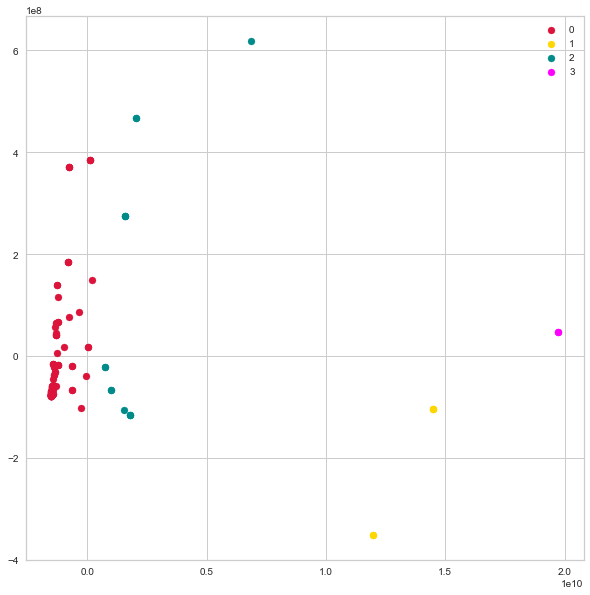

In [56]:
pca = PCA(4)
#Transforme les données avant projection
data = pca.fit_transform(ll[['Période depuis la création (année)',"Nombre d'établissements","Chiffre d'affaires","Salaires et charges","Nbre d'employés min"]])
#Prédiction
label = km.fit_predict(data)
 #centroids = kmeans.cluster_centers_
u_labels = np.unique(label)
 # Create an array with the colors you want to use
colors =['crimson','gold', 'darkcyan', 'magenta']
# Set your custom color palette
sns.set_palette(sns.color_palette(colors))
#Représentation graphique:
plt.figure(figsize=(10,10))
for i in u_labels:
    plt.scatter(data[label == i , 0] , data[label == i , 1] , label = i)
#plt.title('Représentation des clusters du K-Means (avec K = 4)')
plt.savefig('K-Means_K4.png')
plt.legend()
plt.show()

On remarque que le dernier cluster contient une seule entreprise 

In [57]:
# Groupby apply
B=Data.copy()
B['clusters']=clusters
B_group = B.groupby('clusters').mean()
B_group.head(B_group.shape[0])
categories = list(B_group.columns)
B_group

,Période depuis la création (année),Nombre d'établissements,Chiffre d'affaires,Salaires et charges,Nbre d'employés min
clusters,,,,,
0,19.378788,17.530303,3.340588e+08,3.541566e+07,389.030303
1,48.222222,110.222222,1.404023e+09,3.345615e+08,3333.333333
2,72.333333,362.000000,1.689915e+10,2.853440e+08,1366.666667
3,22.000000,4407.000000,8.376600e+09,8.671750e+08,10000.000000


On remarque la variable "pèriode depuis la création" et la variable "nombre d'établissement" sont celles qui ont créé la différence avec le reste des entreprises. 

In [58]:
cl4=B.loc[B['clusters']==3]
cl4=pd.merge(cl4, ll, how = 'inner')
cl4

,Période depuis la création (année),Nombre d'établissements,Chiffre d'affaires,Salaires et charges,Nbre d'employés min,clusters,N° Siren,Nom de la compagnie,Région,Secteur,Titre du poste,Nombre d'offres,declaration
0,22,4407,8.376600e+09,867175000.0,10000.0,3,428268023,Groupe Casino,SAINT-ETIENNE,Activité des hypermarchés,Data Analyst,1,2018.5


le groupe casino est né de la cession d'action de l'entreprise casino qui est été crée le 1898 ce que justifie le résulatat trouvé donc on a décidé de compter la période depuis la création de l'entreprise Casino. 

In [59]:
ll.loc[ll['Nom de la compagnie']=='Groupe Casino','Période depuis la création (année)']=123
df3.loc[df3['Nom de la compagnie']=='Groupe Casino','Période depuis la création (année)']=123

d'après le site statista l'entreprise groupe casino possède 407 établissements

In [60]:
ll.loc[ll['Nom de la compagnie']=='Groupe Casino',"Nombre d'établissements"]=407
df3.loc[df3['Nom de la compagnie']=='Groupe Casino',"Nombre d'établissements"]=407

<ipython-input-61-2ef8edaebee0>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\BOULANGER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.



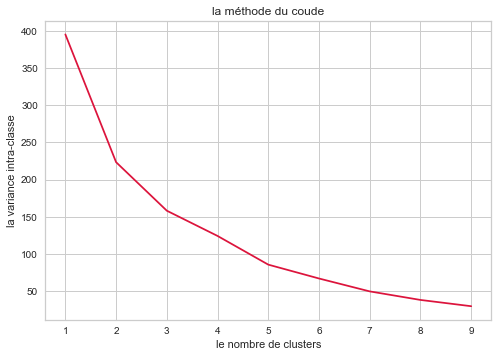

In [61]:
ll.index=ll['Nom de la compagnie']
Data=ll[['Période depuis la création (année)',"Nombre d'établissements","Chiffre d'affaires","Salaires et charges","Nbre d'employés min"]]
Data.drop_duplicates(keep = 'first', inplace=True)
X = Data.values
# Centrage et Réduction
std_scale = preprocessing.StandardScaler().fit(X)
X_scaled = std_scale.transform(X)
inertia=[]
k_range=range(1,10)
for k in k_range:
    model=KMeans(n_clusters=k).fit(X_scaled)
    inertia.append(model.inertia_)
plt.plot(k_range,inertia)  
plt.xlabel('le nombre de clusters')
plt.ylabel('la variance intra-classe')
plt.title('la méthode du coude')
plt.savefig("la méthode du coude.png",dpi=80, format='png', bbox_inches="tight")

C:\Users\BOULANGER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.



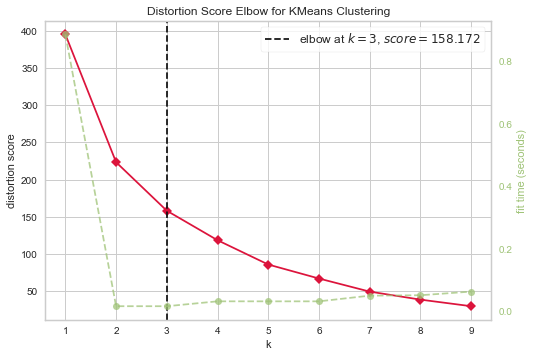

<Figure size 576x396 with 0 Axes>

In [62]:
from yellowbrick.cluster import KElbowVisualizer
coude=KElbowVisualizer(km,k=(1,10),metric='distortion',timing=True)
coude.fit(X_scaled)
coude.show()
plt.tight_layout()
plt.savefig("la méthode du coude3.png",dpi=80, format='png', bbox_inches="tight")

In [63]:
# Nombre de clusters 
n_clust = 3
# Clustering par K-means
km = KMeans(n_clusters=n_clust)
km.fit(X_scaled)
# Récupération des clusters attribués à chaque individu
clusters = km.labels_
clusters

array([0, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0,
       2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 2, 0,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0])

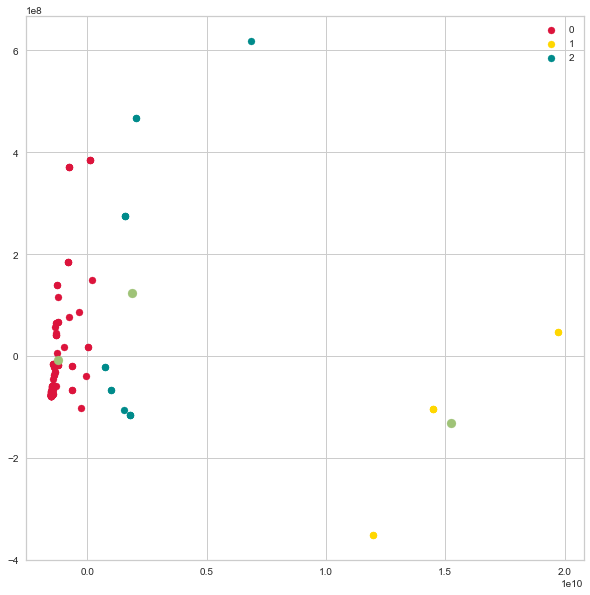

In [64]:
pca = PCA(3)
#Transforme les données avant projection
data = pca.fit_transform(ll[['Période depuis la création (année)',"Nombre d'établissements","Chiffre d'affaires","Salaires et charges","Nbre d'employés min"]])
#Prédiction
label = km.fit_predict(data)
centroids = km.cluster_centers_
u_labels = np.unique(label)
# Create an array with the colors you want to use
colors =['crimson','gold', 'darkcyan']
# Set your custom color palette
sns.set_palette(sns.color_palette(colors))
#Représentation graphique:
plt.figure(figsize=(10,10))
for i in u_labels:
    plt.scatter(data[label == i , 0] , data[label == i , 1] , label = i)
plt.scatter(centroids[:,0] , centroids[:,1] , s = 80, alpha = 1, color = 'g')
#plt.title('Représentation des clusters du K-Means (avec K = 3)')
plt.savefig('K-Means_K3.png')
plt.legend()
plt.show()

In [65]:
# Groupby apply
B=Data.copy()
B['clusters']=clusters
B_group = B.groupby('clusters').mean()
B_group.head(B_group.shape[0])
categories = list(B_group.columns)
B_group

,Période depuis la création (année),Nombre d'établissements,Chiffre d'affaires,Salaires et charges,Nbre d'employés min
clusters,,,,,
0,51.307692,93.461538,3.123701e+09,2.630225e+08,2084.615385
1,67.666667,593.666667,1.090219e+10,6.132239e+08,7333.333333
2,18.777778,10.253968,3.244990e+08,2.877349e+07,328.190476


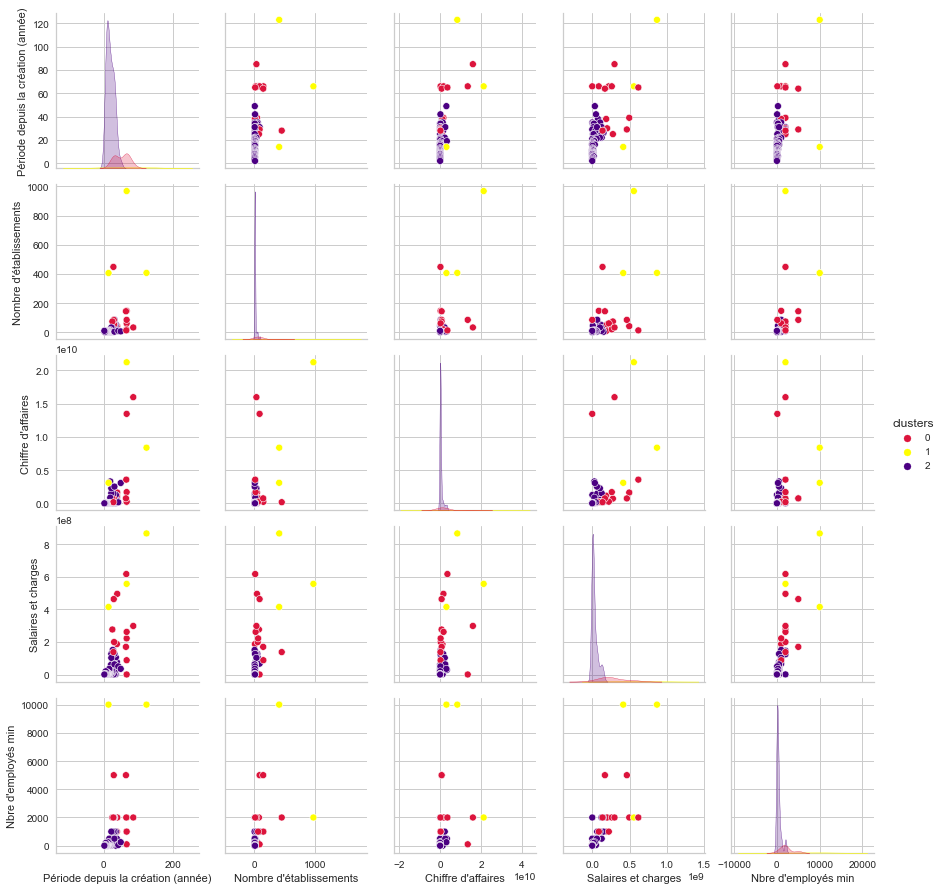

In [66]:
#ajouter la variable au data frame initial
colors = ['crimson','yellow', 'indigo']
B=Data.copy()
B['clusters']=clusters
#configuration des points dans le plan
#des variables prises par paire
sns.pairplot(B,hue="clusters", palette= colors)
plt.savefig("graphiques par paire selon les clusters .png",dpi=80, format='png', bbox_inches="tight")


In [67]:
colors = ['crimson','gold', 'darkcyan', 'magenta']
y = np.log(np.array(B_group))
fig_bars = make_subplots(rows = 1, cols = 4, shared_yaxes = True)


# Cluster 1
fig_bars.add_trace(go.Bar(x = categories, 
                          y = y[:1,:].tolist()[0],
                          marker = dict(color = colors,),
                          name = 'Cluster - 1'),
                   row = 1, 
                   col = 1)
# Cluster 2
fig_bars.add_trace(go.Bar(x = categories, 
                          y = y[1:2,:].tolist()[0],
                          marker = dict(color = colors),
                          name = 'Cluster - 2'),
                   row = 1,
                   col = 2)

# Cluster 3
fig_bars.add_trace(go.Bar(x = categories, 
                          y = y[2:3,:].tolist()[0],
                          marker = dict(color = colors), 
                          name = 'Cluster - 3'),
                   row = 1,
                   col = 3)

fig_bars.update_layout(showlegend = False, title = 'Scores moyens des différentes variables dans nos trois clusters')

fig_bars.show()


In [68]:
#créer des data_frames contenent les entreprises avec leurs clusters
cluster1=B.loc[B['clusters']==0]
cluster1=pd.merge(cluster1, ll, how = 'inner')
cluster2=B.loc[B['clusters']==1]
cluster2=pd.merge(cluster2, ll, how = 'inner')
cluster3=B.loc[B['clusters']==2]
cluster3=pd.merge(cluster3, ll, how = 'inner')


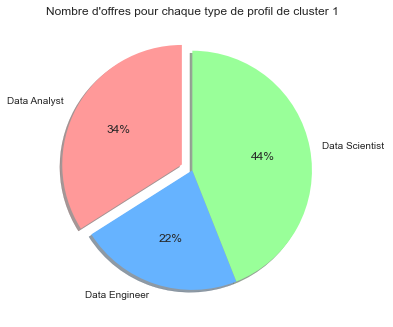

In [69]:
cluster1_off=cluster1.groupby(['Titre du poste']).sum().reset_index()
cluster1_off[['Titre du poste',"Nombre d'offres"]]
cluster1_off["Nombre d'offres"]=round(cluster1_off["Nombre d'offres"]/cluster1_off["Nombre d'offres"].sum()*100)
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99']
explode = (0.1, 0, 0)
plt.pie(cluster1_off["Nombre d'offres"], explode=explode,labels=cluster1_off['Titre du poste'].unique(),autopct="%1.0f%%",colors=colors,shadow=True, startangle=90)
plt.title("Nombre d'offres pour chaque type de profil de cluster 1")
plt.savefig("Nombre d'offres pour chaque type de profil de groupe 1.png")

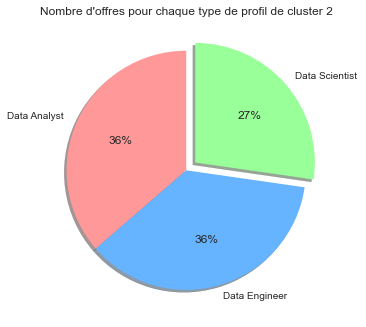

In [70]:
cluster2_off=cluster2.groupby(['Titre du poste']).sum().reset_index()
cluster2_off["Nombre d'offres"]=round(cluster2_off["Nombre d'offres"]/cluster2_off["Nombre d'offres"].sum()*100)
explode = (0, 0, 0.1)
plt.pie(cluster2_off["Nombre d'offres"], explode=explode,labels=cluster2_off['Titre du poste'].unique(),autopct="%1.0f%%",colors=colors,shadow=True, startangle=90)
plt.title("Nombre d'offres pour chaque type de profil de cluster 2")
plt.savefig("Nombre d'offres pour chaque type de profil de groupe 2.png")

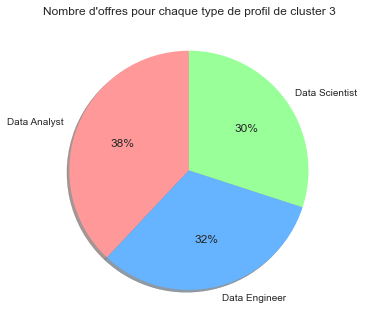

In [71]:
cluster3_off=cluster3.groupby(['Titre du poste']).sum().reset_index()
cluster3_off["Nombre d'offres"]=round(cluster3_off["Nombre d'offres"]/cluster3_off["Nombre d'offres"].sum()*100)
explode = (0, 0, 0)
plt.pie(cluster3_off["Nombre d'offres"], explode=explode,labels=cluster3_off['Titre du poste'].unique(),autopct="%1.0f%%",colors=colors,shadow=True, startangle=90)
plt.title("Nombre d'offres pour chaque type de profil de cluster 3")
plt.savefig("Nombre d'offres pour chaque type de profil de groupe 3.png")

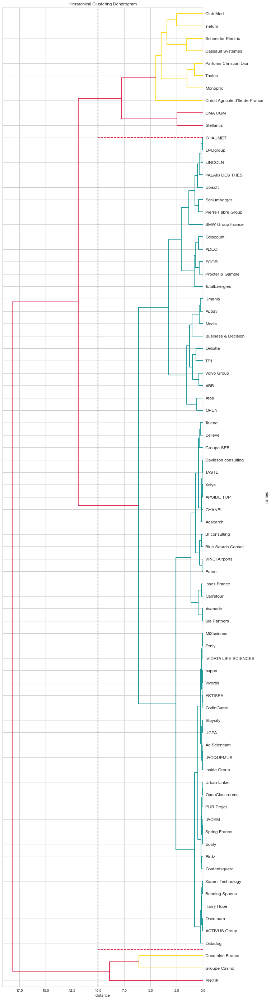

In [72]:
from scipy.cluster.hierarchy import linkage, fcluster
from sklearn import preprocessing

names= Data.index
# Centrage et Réduction
std_scale = preprocessing.StandardScaler().fit(X)
X_scaled = std_scale.transform(X)
# Clustering hiérarchique
Z = linkage(X_scaled, 'ward')
# Affichage du dendrogramme
fig, ax= plt.subplots(1,1, figsize=(10,50))
ax.set_title('Hierarchical Clustering Dendrogram')
ax.set_xlabel('distance')
ax.set_ylabel('names')
dendrogram(
    Z, 
    orientation = "left",
    leaf_rotation=0.,
    leaf_font_size=12,
    color_threshold=7,
    labels = names
)
ax.yaxis.set_label_position('right')
ax.yaxis.tick_right()
plt.axvline(x= 10, color='k',linestyle='--')
plt.hlines(y=30,xmin=0, xmax=10,linestyle='--')
plt.hlines(y=685,xmin=0, xmax=10,linestyle='--')
plt.savefig("dendrogram.png",dpi=80, format='png', bbox_inches="tight")

In [73]:
clusters_h = fcluster(Z, 3, criterion='maxclust')
Data.loc[:,'clusters_h'] = fcluster(Z, 3, criterion='maxclust')
cluster_h=Data[['clusters_h']]


C:\Users\BOULANGER\anaconda3\lib\site-packages\pandas\core\indexing.py:1597: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\BOULANGER\anaconda3\lib\site-packages\pandas\core\indexing.py:1676: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [74]:
centroide=Data.groupby(['clusters_h']).mean().reset_index()

In [75]:
centroide

,clusters_h,Période depuis la création (année),Nombre d'établissements,Chiffre d'affaires,Salaires et charges,Nbre d'employés min
0,1,67.666667,593.666667,1.090219e+10,6.132239e+08,7333.333333
1,2,19.333333,11.863636,3.422147e+08,3.751915e+07,389.030303
2,3,57.400000,107.800000,3.846539e+09,2.755758e+08,2210.000000


In [76]:
df_tab=pd.merge(B, df3, how = 'inner')


In [77]:
df_tab.to_excel('dash.xlsx')

In [78]:
colors = ['crimson','gold', 'darkcyan', 'magenta']
y = np.log(np.array(centroide))
fig_bars = make_subplots(rows = 1, cols = 4, shared_yaxes = True)


# Cluster 1
fig_bars.add_trace(go.Bar(x = categories, 
                          y = y[:1,1:6].tolist()[0],
                          marker = dict(color = colors,),
                          name = 'Cluster - 1'),
                   row = 1, 
                   col = 1)
# Cluster 2
fig_bars.add_trace(go.Bar(x = categories, 
                          y = y[1:2,1:6].tolist()[0],
                          marker = dict(color = colors),
                          name = 'Cluster - 2'),
                   row = 1,
                   col = 2)

# Cluster 3
fig_bars.add_trace(go.Bar(x = categories, 
                          y = y[2:3,1:6].tolist()[0],
                          marker = dict(color = colors), 
                          name = 'Cluster - 3'),
                   row = 1,
                   col = 3)

fig_bars.update_layout(showlegend = False, title = 'Scores moyens des différentes variables dans nos trois clusters(dendrogramme)')

fig_bars.show()


In [79]:
#créer des data_frames contenent les entreprises avec leurs clusters
cluster_h1=Data.loc[Data['clusters_h']==1]
cluster_h1=pd.merge(cluster_h1, ll, how = 'inner')
cluster_h2=Data.loc[Data['clusters_h']==2]
cluster_h2=pd.merge(cluster_h2, ll, how = 'inner')
cluster_h3=Data.loc[Data['clusters_h']==3]
cluster_h3=pd.merge(cluster_h3, ll, how = 'inner')

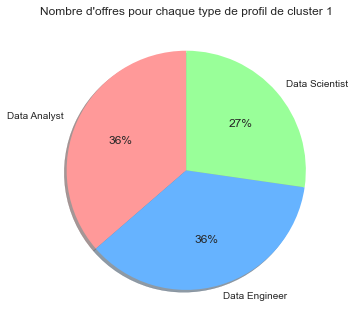

In [80]:
cluster_h1_off=cluster_h1.groupby(['Titre du poste']).sum().reset_index()
cluster_h1_off[['Titre du poste',"Nombre d'offres"]]
cluster_h1_off["Nombre d'offres"]=round(cluster_h1_off["Nombre d'offres"]/cluster_h1_off["Nombre d'offres"].sum()*100)
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99']
explode = (0, 0, 0)
plt.pie(cluster_h1_off["Nombre d'offres"], explode=explode,labels=cluster_h1_off['Titre du poste'].unique(),autopct="%1.0f%%",colors=colors,shadow=True, startangle=90)
plt.title("Nombre d'offres pour chaque type de profil de cluster 1")
plt.savefig("Nombre d'offres pour chaque type de profil de groupe 1 (dendogramme).png")

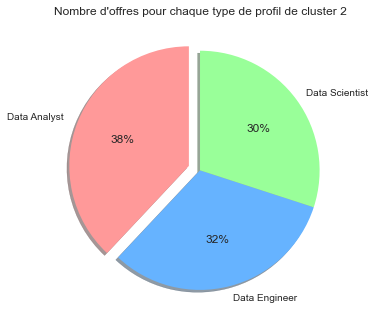

In [81]:
cluster_h2_off=cluster_h2.groupby(['Titre du poste']).sum().reset_index()
cluster_h2_off["Nombre d'offres"]=round(cluster_h2_off["Nombre d'offres"]/cluster_h2_off["Nombre d'offres"].sum()*100)
explode = (0.1, 0, 0)
plt.pie(cluster_h2_off["Nombre d'offres"], explode=explode,labels=cluster_h2_off['Titre du poste'].unique(),autopct="%1.0f%%",colors=colors,shadow=True, startangle=90)
plt.title("Nombre d'offres pour chaque type de profil de cluster 2")
plt.savefig("Nombre d'offres pour chaque type de profil de groupe 2(dendogramme).png")

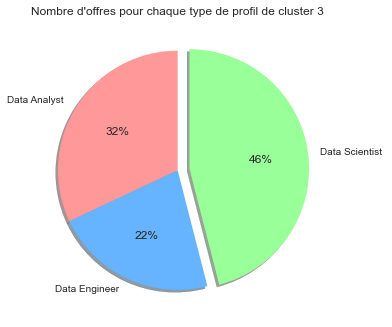

In [82]:
cluster_h3_off=cluster_h3.groupby(['Titre du poste']).sum().reset_index()
cluster_h3_off["Nombre d'offres"]=round(cluster_h3_off["Nombre d'offres"]/cluster_h3_off["Nombre d'offres"].sum()*100)
explode = (0, 0, 0.1)
plt.pie(cluster_h3_off["Nombre d'offres"], explode=explode,labels=cluster_h3_off['Titre du poste'].unique(),autopct="%1.0f%%",colors=colors,shadow=True, startangle=90)
plt.title("Nombre d'offres pour chaque type de profil de cluster 3")
plt.savefig("Nombre d'offres pour chaque type de profil de groupe 3(dendogramme).png")

In [83]:
Data

,Période depuis la création (année),Nombre d'établissements,Chiffre d'affaires,Salaires et charges,Nbre d'employés min,clusters_h
Nom de la compagnie,,,,,,
Dassault Systèmes,39,42,1.625348e+09,4.958040e+08,2000.0,3
Pierre Fabre Group,38,17,8.828516e+08,7.690156e+07,500.0,2
TF1,38,9,1.149675e+09,1.871750e+08,1000.0,2
ABB,35,54,5.364762e+08,1.056800e+08,1000.0,2
Ubisoft,35,6,1.262532e+09,1.990500e+06,3.0,2
...,...,...,...,...,...,...
Devoteam,5,3,6.029967e+06,4.177546e+06,50.0,2
Bending Spoons,4,2,6.836130e+05,7.210125e+05,3.0,2
Xiaomi Technology,3,2,2.851393e+07,1.552247e+06,20.0,2


<ipython-input-134-2ce51a88819c>:24: MatplotlibDeprecationWarning:

savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later



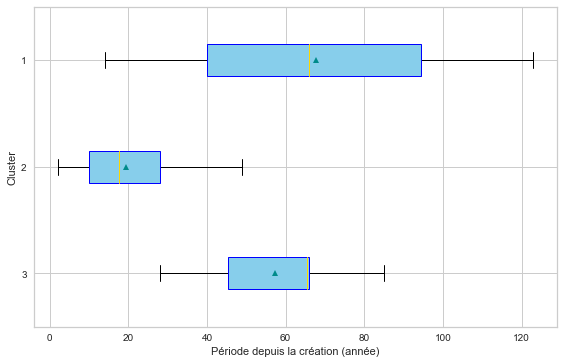

In [134]:
X = "clusters_h" # qualitative

Y = "Période depuis la création (année)" # quantitative

sous_echantillon = Data.copy()
modalites = sous_echantillon[X].unique()
groupes = []
for m in modalites:
    groupes.append(sous_echantillon[sous_echantillon[X]==m][Y])
# Propriétés graphiques (pas très importantes)    
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
    
bp=plt.boxplot(groupes, labels=modalites, showfliers=False, 
            vert=False, patch_artist=True, showmeans=True)
for patch in bp['boxes']:
    patch.set_color('skyblue')
    patch.set_edgecolor('blue')
#plt.title("Comparaison des distributions des clusters selon la période depuis la création des entreprises ")
plt.xlabel("Période depuis la création (année)")
plt.ylabel("Cluster")
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig("Comparaison des distributions des clusters selon la période depuis la création des entreprises .jpg",bbox="tight",pad_inches=2,transparent=True)


<ipython-input-135-fd9c305b9196>:24: MatplotlibDeprecationWarning:

savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later



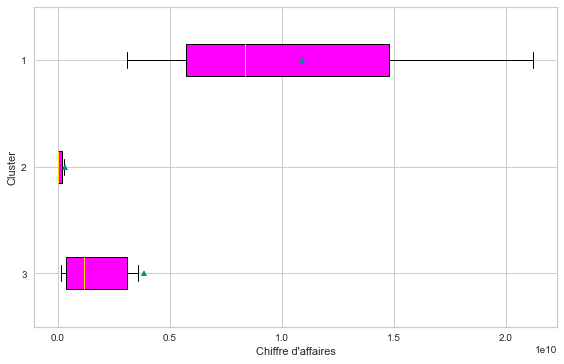

In [135]:
X = "clusters_h" # qualitative

Y = "Chiffre d'affaires" # quantitative

sous_echantillon = Data.copy()
modalites = sous_echantillon[X].unique()
groupes = []
for m in modalites:
    groupes.append(sous_echantillon[sous_echantillon[X]==m][Y])
# Propriétés graphiques (pas très importantes)    
medianprops = {'color':""}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
    
bp=plt.boxplot(groupes, labels=modalites, showfliers=False, 
            vert=False, patch_artist=True, showmeans=True)
for patch in bp['boxes']:
    patch.set_color('magenta')
    patch.set_edgecolor('black')
#plt.title("Comparaison des distributions des clusters selon le chiffre d'affaires des entreprises ")
plt.xlabel("Chiffre d'affaires")
plt.ylabel("Cluster")
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig("Comparaison des distributions des clusters selon le chiffre d'affaires des entreprises .jpg",bbox="tight",pad_inches=2,transparent=True)


<ipython-input-136-1ca678a81e55>:24: MatplotlibDeprecationWarning:

savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later



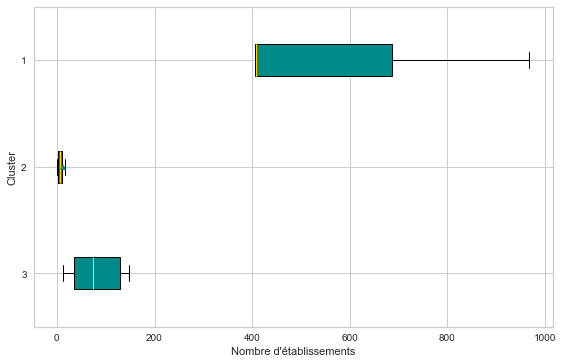

In [136]:
X = "clusters_h" # qualitative

Y = "Nombre d'établissements" # quantitative

sous_echantillon = Data.copy()
modalites = sous_echantillon[X].unique()
groupes = []
for m in modalites:
    groupes.append(sous_echantillon[sous_echantillon[X]==m][Y])
# Propriétés graphiques (pas très importantes)    
medianprops = {'color':""}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
    
bp=plt.boxplot(groupes, labels=modalites, showfliers=False, 
            vert=False, patch_artist=True, showmeans=True)
for patch in bp['boxes']:
    patch.set_color('darkcyan')
    patch.set_edgecolor('black')
#plt.title("Comparaison des distributions des clusters selon le nombre d'établissements des entreprises ")
plt.xlabel("Nombre d'établissements")
plt.ylabel("Cluster")
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig("Comparaison des distributions des clusters selon le nombre d'établissements des entreprises .jpg",bbox="tight",pad_inches=2,transparent=True)


<ipython-input-137-05d495d9f4d7>:24: MatplotlibDeprecationWarning:

savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later



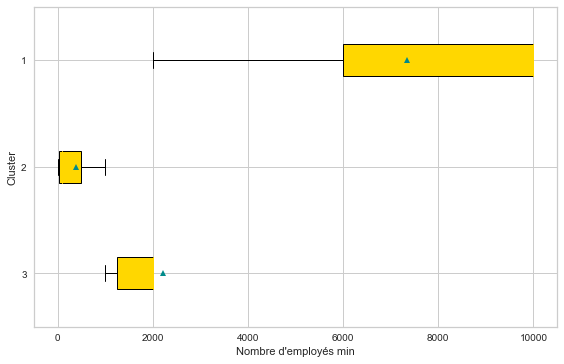

In [137]:
X = "clusters_h" # qualitative

Y = "Nbre d'employés min" # quantitative

sous_echantillon = Data.copy()
modalites = sous_echantillon[X].unique()
groupes = []
for m in modalites:
    groupes.append(sous_echantillon[sous_echantillon[X]==m][Y])
# Propriétés graphiques (pas très importantes)    
medianprops = {'color':""}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
    
bp=plt.boxplot(groupes, labels=modalites, showfliers=False, 
            vert=False, patch_artist=True, showmeans=True)
for patch in bp['boxes']:
    patch.set_color('gold')
    patch.set_edgecolor('black')
#plt.title("Comparaison des distributions des clusters selon le nombre d'employés des entreprises ")
plt.xlabel("Nombre d'employés min")
plt.ylabel("Cluster")
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig("Comparaison des distributions des clusters selon le Nbre d'employés des entreprises .jpg",bbox="tight",pad_inches=2,transparent=True)
